In [2]:
from sys import path
path.append("..")

import numpy as np
import networkx as nx
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from rdd import measures
from rdd import RDD
from rdd import visualize
from rdd import other_sims
from rdd import ascos
from rdd import cos_sim
from numpy.linalg import norm
from itertools import combinations
%matplotlib inline

G = nx.read_adjlist('../data/facebook_combined.txt', nodetype=int)

# Experiment

Graph $G$ is of diameter 8. I'm going to color it by global_graph_degree RDD of diameter 4. Then I'm going to do the following:

1. Pick 5 nodes that look visually very similar but have different degree (9, 1, 24, 17, 3) and compute RDD global_graph_degree for all pairs 

2. Pick 5 nodes that look dissimilar but all have the exact same degree (2) and do the same thing

# Graph

In [3]:
pos = nx.spring_layout(G)
visualize.visualize_rdd_vector(G, 0, 3, pos, [measures.global_graph_degree])

FigureWidget({
    'data': [{'line': {'width': 1},
              'marker': {'color': array([  1.        , 618.…

# Nodes

For the similar group, we chose nodes of different degree, but all from the same community.

For the dissimilar group, we chose nodes of the same degree, but of very different places in the graph (a couple community connectors, a couple randoms, and one from the same community as those in the similar group).

In [4]:
# These are all randos from the same community but different degrees (9, 1, 24, 17, 3)
similar = [3580, 3853, 3956, 3960, 3801]

# all degree 2 but totally different structurally
dissimilar = [1967, 3922, 42, 1394, 3407]


def compare_community(nodes):
    rdd_list = []
    for u, v in combinations(nodes, 2):
        rd = measures.realworld_distance_compare(G, u, v, measures.global_graph_degree, 3)
        rdd_list.append(rd)
        print(f"{u} and {v} rdd: {rd}")
    print("normalized value of RDDs:", norm(rdd_list))

In [5]:
compare_community(similar)

3580 and 3853 rdd: 42.58066747011558
3580 and 3956 rdd: 179.80998964480617
3580 and 3960 rdd: 80.47224991077414
3580 and 3801 rdd: 28.07276647028654
3853 and 3956 rdd: 222.39065711492174
3853 and 3960 rdd: 123.05291738088972
3853 and 3801 rdd: 14.50790099982904
3956 and 3960 rdd: 99.33773973403203
3956 and 3801 rdd: 207.88275611509272
3960 and 3801 rdd: 108.54501638106068
normalized value of RDDs: 413.62296876174196


In [6]:
compare_community(dissimilar)

1967 and 3922 rdd: 13193.8382360941
1967 and 42 rdd: 10938.553694842847
1967 and 1394 rdd: 1595.09056151606
1967 and 3407 rdd: 6926.789826696457
3922 and 42 rdd: 3479.289567496051
3922 and 1394 rdd: 11750.314004340675
3922 and 3407 rdd: 6267.048409397645
42 and 1394 rdd: 9495.029463089422
42 and 3407 rdd: 4011.763868146391
1394 and 3407 rdd: 5483.265594943032
normalized value of RDDs: 25884.77007473804


# Observation

As expected, the similar nodes with different degrees have significantly lower RDD values among each other than do the structurally dissimilar nodes with the same degree.

# Histograms

In [7]:
dfs_similar = {}
for node in similar:
    dfs_similar[node] = measures.get_rdds_for_visuals_vector(G, node, [measures.global_graph_degree], 3)

dissimilar_dfs = {}
for node in dissimilar:
    dissimilar_dfs[node] = measures.get_rdds_for_visuals_vector(G, node, [measures.global_graph_degree], 3)

## Similar group

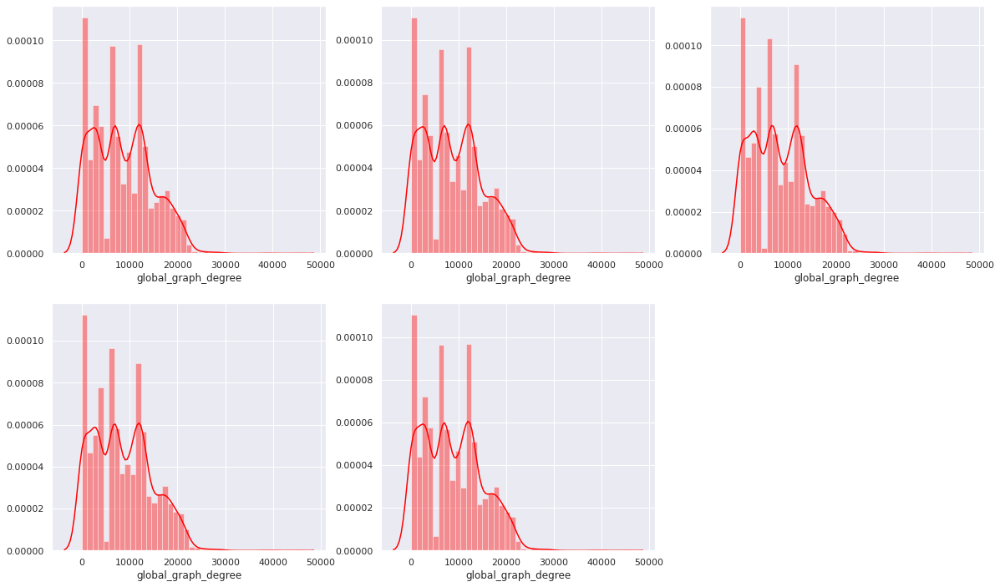

In [11]:
fig = plt.figure(figsize=(20,12))
for i, d in enumerate(dfs_similar):
    fig.add_subplot(2, 3, i+1)
    sns.distplot(dfs_similar[d]['global_graph_degree'], color="Red")
# sns.distplot(df, rug=False, kde=False)

## Dissimilar group

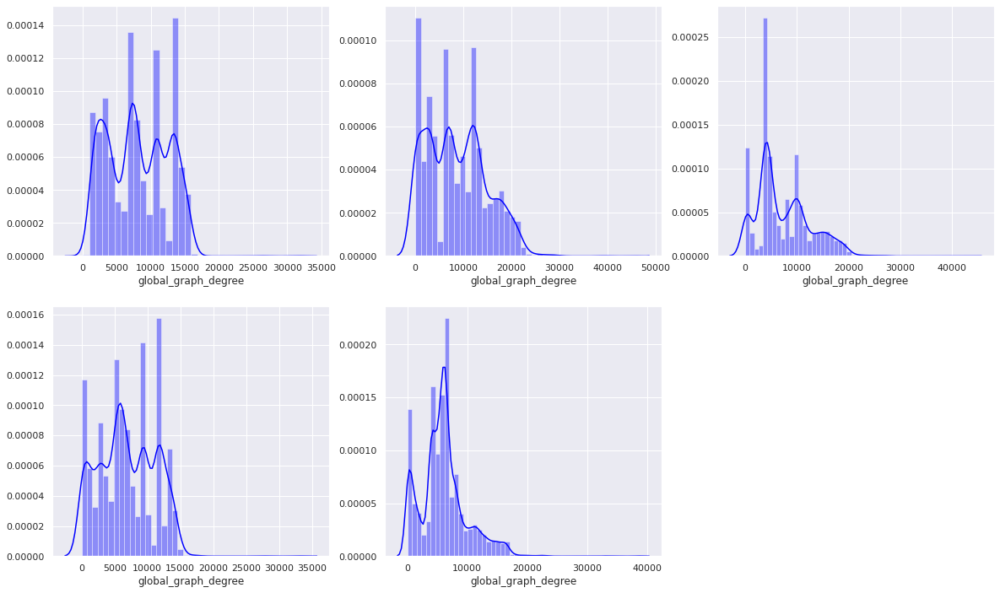

In [10]:
fig = plt.figure(figsize=(20,12))
for i, d in enumerate(dissimilar_dfs):
    fig.add_subplot(2, 3, i+1)
    sns.distplot(dissimilar_dfs[d]['global_graph_degree'], color="Blue")
# sns.distplot(df, rug=False, kde=False)

# Conclusion

While the histograms for the dissimilar nodes look significantly different from each other, the histograms from the similar nodes look nearly identical.

In [2]:
root_nodes = [3580, 3853]

In [3]:
df_ascos = {}
for node in root_nodes:
    df_ascos[node] = ascos.get_ascos(G, node)

fig = plt.figure(figsize=(20,12))
for i, d in enumerate(df_ascos):
    fig.add_subplot(2, 3, i+1)
    sns.distplot(df_ascos[d]['ascos'], color="Green", kde=False)

NameError: name 'ascos' is not defined

In [ ]:
df_cos = {}
for node in root_nodes:
    df_cos[node] = cos_sim.get_cosine(G, node)

fig = plt.figure(figsize=(20,12))
for i, d in enumerate(df_cos):
    fig.add_subplot(2, 3, i+1)
    sns.distplot(df_cos[d]['cos_sim'], color="Purple", kde=False)

In [ ]:
df_rdds = {}
for node in root_nodes:
    df_rdds[node] = RDD.get_rdds_for_visuals_vector(G, node, [measures.global_graph_degree], 3)

fig = plt.figure(figsize=(20,12))
for i, d in enumerate(df_rdds):
    fig.add_subplot(2, 3, i+1)
    sns.distplot(df_rdds[d]['global_graph_degree'], color="Blue", kde=False)

In [ ]:
df_sims = {}
for node in root_nodes:
    df_sims[node] = other_sims.simrank(G, node)
    
fig = plt.figure(figsize=(20,12))
for i, d in enumerate(df_sims):
    fig.add_subplot(2, 3, i+1)
    sns.distplot(df_sims[d]['simrank'], color="Red", kde=False)

In [2]:
#G = nx.read_gml('../data/karate.gml', label='id')
#pos = nx.spring_layout(G)

In [4]:
visualize.visualize_rdd_vector(G, 1, 3, pos, [measures.global_graph_degree])

NameError: name 'pos' is not defined

In [5]:
root_nodes = [3580, 3853, 3956, 3960, 3801]


In [6]:
df_rdds = {}
for node in root_nodes:
    df_rdds[node] = RDD.get_rdds_for_visuals_vector_radius(G, node, [measures.global_graph_degree], 3)

print(df_rdds)
real_paths1 = nx.single_source_shortest_path(G, 3580, 3)

g = G.subgraph(list(real_paths1.keys()))
print()

{3580:      node_name  radius  degree  global_graph_degree  normalized_rdd
0          107       1      46          1119.032537     1119.032537
1         1553       1      12          1249.750989     1249.750989
2         1555       1      21          1187.382378     1187.382378
3         1687       1      22          1105.017871     1105.017871
4         1803       1      22          1194.268449     1194.268449
..         ...     ...     ...                  ...             ...
698       3975       1      15            69.643143       69.643143
699       3976       1      15           143.954790      143.954790
700       3977       1       6            20.290334       20.290334
701       3978       1       4             8.678794        8.678794
702       3979       1      12            33.166114       33.166114

[703 rows x 5 columns], 3853:      node_name  radius  degree  global_graph_degree  normalized_rdd
0          107       1      46          1161.613205     1161.613205
1         

In [11]:
print(len(g))

703


In [6]:
df_ascos = {}
for node in root_nodes:
    # df_rdds[node] = RDD.get_rdds_for_visuals_vector(G, node, [measures.global_graph_degree], 3)
    # df_sims[node] = other_sims.simrank_radius(G, node, 5)
    df_ascos[node] = ascos.get_ascos_radius(G, node, 3)

In [12]:
df_cos = {}
for node in root_nodes:
    df_cos[node] = cos_sim.get_cosine_radius(G, node, 3)

print(df_cos)

{3580:      node_name  degree   cos_sim
0          107    1045  0.000000
1         1553      37  0.000000
2         1555      35  0.000000
3         1687      43  0.000000
4         1803      25  0.000000
..         ...     ...       ...
698       3975      15  3.752441
699       3976      15  3.752441
700       3977       6  4.213608
701       3978       4  4.354734
702       3979      12  3.883035

[703 rows x 3 columns]}


In [14]:
# root_nodes = [3580, 3853, 3956, 3960, 3801]

# df_rdds = {}
# # df_sims = {}
# df_ascos = {}
# df_cos = {}
# for node in root_nodes:
#     df_rdds[node] = RDD.get_rdds_for_visuals_vector(G, node, [measures.global_graph_degree], 3)
#     # df_sims[node] = other_sims.simrank_radius(G, node, 5)
#     df_ascos[node] = ascos.get_ascos_radius(G, node, 3)
#     df_cos[node] = cos_sim.get_cosine_radius(G, node, 3)


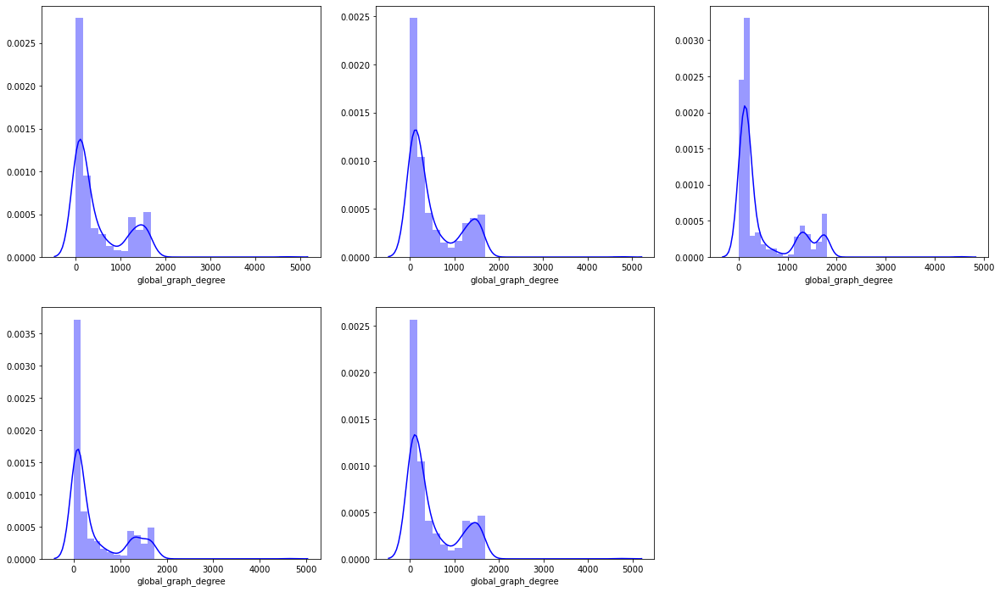

In [7]:
fig = plt.figure(figsize=(20,12))
for i, d in enumerate(df_rdds):
    fig.add_subplot(2, 3, i+1)
    sns.distplot(df_rdds[d]['global_graph_degree'], color="Blue", kde=True)

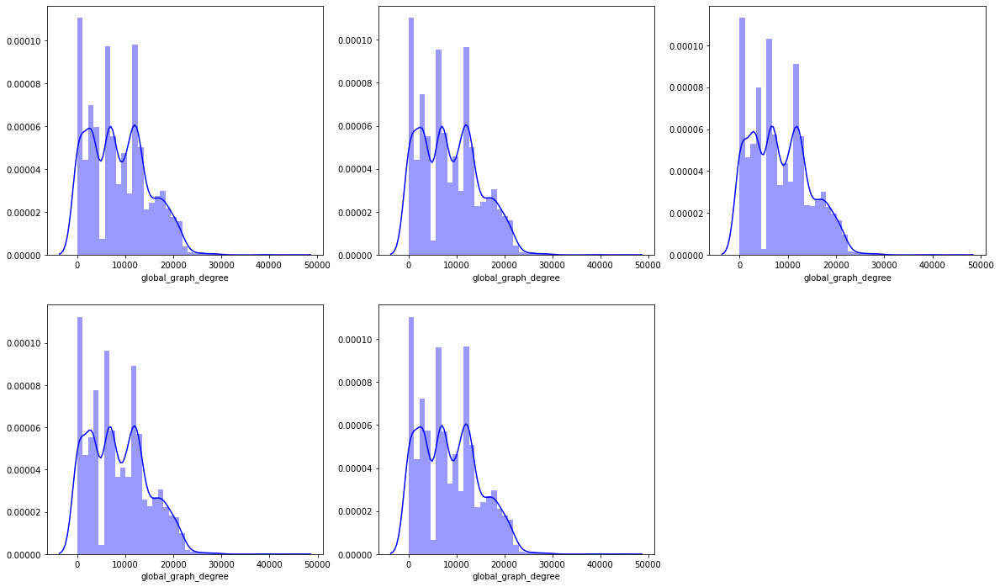

In [11]:
fig = plt.figure(figsize=(20,12))
for i, d in enumerate(df_rdds):
    fig.add_subplot(2, 3, i+1)
    sns.distplot(df_rdds[d]['global_graph_degree'], color="Blue", kde=True)

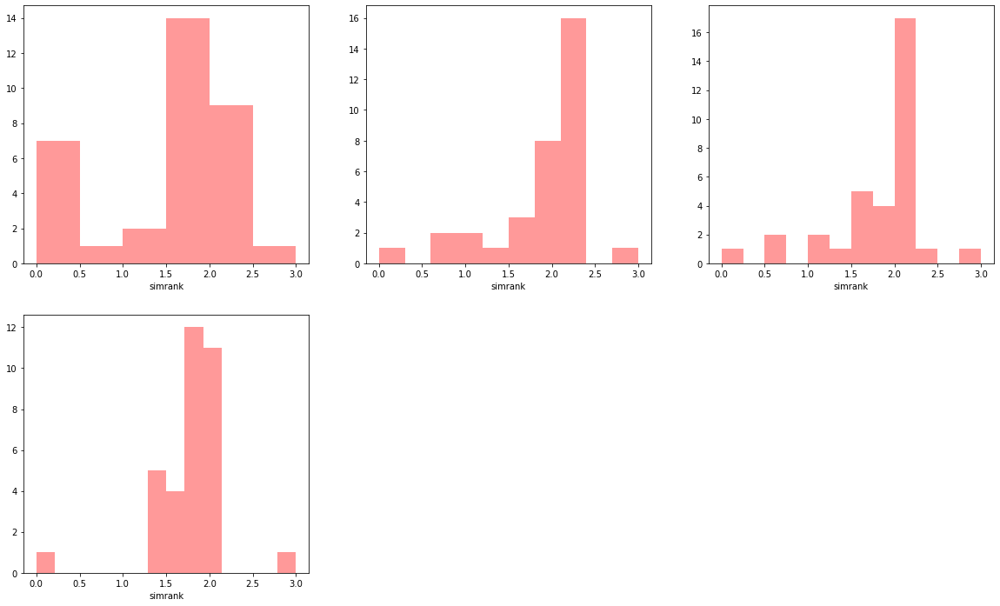

In [6]:
fig = plt.figure(figsize=(20,12))
for i, d in enumerate(df_sims):
    fig.add_subplot(2, 3, i+1)
    sns.distplot(df_sims[d]['simrank'], color="Red", kde=False)

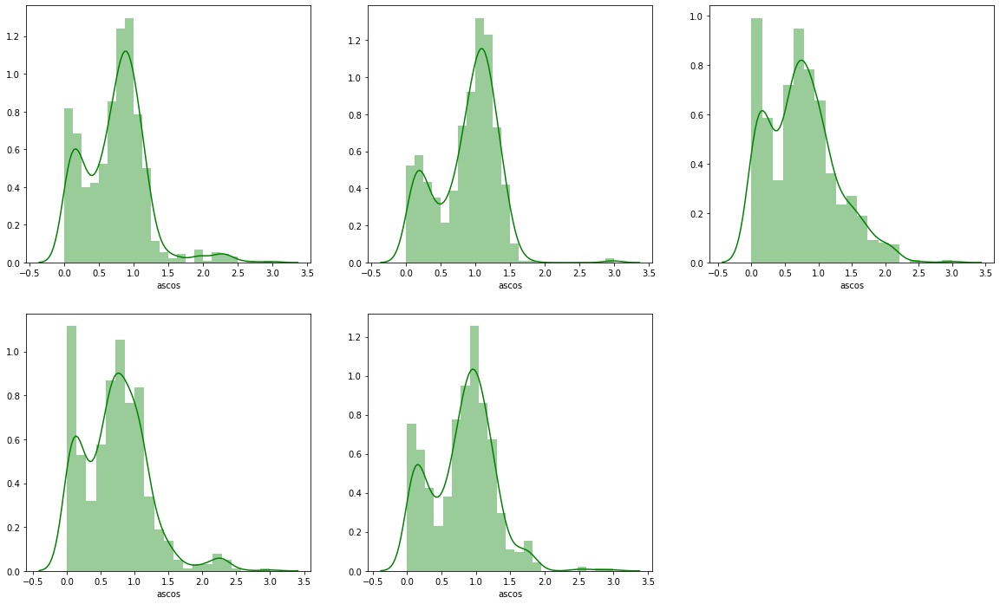

In [12]:
fig = plt.figure(figsize=(20,12))
for i, d in enumerate(df_ascos):
    fig.add_subplot(2, 3, i+1)
    sns.distplot(df_ascos[d]['ascos'], color="Green", kde=True)

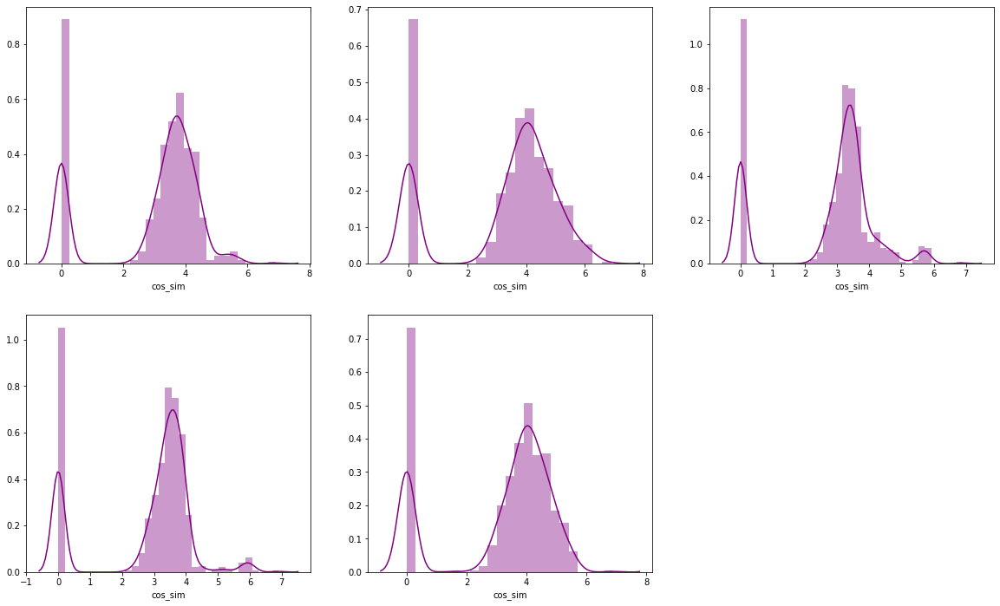

In [13]:
fig = plt.figure(figsize=(20,12))
for i, d in enumerate(df_cos):
    fig.add_subplot(2, 3, i+1)
    sns.distplot(df_cos[d]['cos_sim'], color="Purple", kde=True)